---
# Nordic Components
Preprocess line-scanning data by removing various number of components. Currently, the range goes from 50-99% in steps of 5 as well as the standard 'elbow' method.

## reconstruct
This stuff can be run in parallel on the cluster, but with too many jobs it might start complaining about memory allocation.
```bash
subID=001; sesID=3; for i in 0 50 75 90 elbow; do if [[ ${i} == "elbow" ]]; then suff="desc-elbow_bold"; else suff="desc-${i}p_bold"; fi; master -m 03a -s ${subID} -n ${sesID} -c ${i} -f ${suff} -q short.q --sge; done
```

## lsprep
Because the log-file is the same regardless of the suffix used, we can't really run this thing in parallel..
```bash
i=50; suff="desc-${i}p_bold"; subID=001; sesID=3; master -m 03b -s ${subID} -n ${sesID} -x --filter_pca=0.18,--verbose,--no_button,--ow,--ica,--filters=$suff,--suffix=${suff} --sge
```

```bash
subID=001; sesID=3; for i in 0 50 75 90 elbow; do if [[ ${i} == "elbow" ]]; then suff="desc-elbow_bold"; else suff="desc-${i}p_bold"; fi; master -m 03b -s ${subID} -n ${sesID} -x --filter_pca=0.15,--verbose,--no_button,--ow,--coil=150,--filters=${suff},--suffix=${suff}; done
```


In [1]:
from linescanning import (
    utils,
    plotting,
    fitting,
    preproc,
    glm
)
import nibabel as nb
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import holeresponse as hr
opj = os.path.join

In [2]:
# import subject dictionary containing useful information
subj_obj = hr.utils.SubjectsDict(proj_dir="/data1/projects/MicroFunc/Jurjen/projects/VE-NORDIC")
subj_obj.get_colors()

['#1B9E77', '#D95F02', '#4c75ff']

In [3]:
# get h5-file
repo_dir = "/data1/projects/MicroFunc/Jurjen/programs/project_repos/holeresponse"

incl_subjs = subj_obj.get_subjects()
excl = [
    # "sub-003",
    # "sub-008",
    # "sub-014"
]

h5_files = []
for i in incl_subjs:
    if not i in excl:
        ses = subj_obj.get_session(i)
        h5 = utils.FindFiles(opj(subj_obj.deriv_dir, "lsprep", i), extension="h5").files

        if len(h5)>0:
            h5_filt = utils.get_file_from_substring([f"ses-{ses}"], h5)

            if isinstance(h5_filt, list):
                h5_files += h5_filt
            else:
                h5_files.append(h5_filt)

h5_files

['/data1/projects/MicroFunc/Jurjen/projects/VE-NORDIC/derivatives/lsprep/sub-001/sub-001_ses-3_desc-0p_bold.h5',
 '/data1/projects/MicroFunc/Jurjen/projects/VE-NORDIC/derivatives/lsprep/sub-001/sub-001_ses-3_desc-50p_bold.h5',
 '/data1/projects/MicroFunc/Jurjen/projects/VE-NORDIC/derivatives/lsprep/sub-001/sub-001_ses-3_desc-75p_bold.h5',
 '/data1/projects/MicroFunc/Jurjen/projects/VE-NORDIC/derivatives/lsprep/sub-001/sub-001_ses-3_desc-90p_bold.h5',
 '/data1/projects/MicroFunc/Jurjen/projects/VE-NORDIC/derivatives/lsprep/sub-001/sub-001_ses-3_desc-elbow_bold.h5',
 '/data1/projects/MicroFunc/Jurjen/projects/VE-NORDIC/derivatives/lsprep/sub-002/sub-002_ses-3_desc-0p_bold.h5',
 '/data1/projects/MicroFunc/Jurjen/projects/VE-NORDIC/derivatives/lsprep/sub-002/sub-002_ses-3_desc-50p_bold.h5',
 '/data1/projects/MicroFunc/Jurjen/projects/VE-NORDIC/derivatives/lsprep/sub-002/sub-002_ses-3_desc-75p_bold.h5',
 '/data1/projects/MicroFunc/Jurjen/projects/VE-NORDIC/derivatives/lsprep/sub-002/sub-002

In [4]:
# dd = hr.data.H5Parser.read_single_h5(h5_files[3])
# print(dd["func"].shape)
# dd["func"].head()

In [5]:
# h5_obj = hr.data.H5Parser(
#     h5_files[3],
#     verbose=False,
#     compartments=20,
#     lp_kw={
#     "window_length": 17
#     },
#     lp=True
# )

In [6]:
# h5_files[-3].split("_")[-2].split("-")[-1]

In [7]:
utils.subjects_in_list(h5_files)

['001', '002', '003', '005', '006', '008', '010', '011', '013', '014']

In [9]:
h5_obj = hr.data.H5Parser(
    h5_files[0],
    verbose=False,
    compartments=20,
    lp_kw={
    "window_length": 17
    },
    lp=True,
    excl_runs=False
)

In [16]:
h5_obj.exclude_runs(h5_obj.df_onsets, "sub-001")

onset
subject task run event_type            
001     SRFb 2   suppr_2      30.015976
                 suppr_1      46.332903
                 act          66.732840
                 act          82.882682
                 suppr_2      99.365912
                 suppr_1     116.890847
                 act         132.932461
                 act         158.931925
                 suppr_1     176.757263
                 suppr_2     198.840483
                 suppr_1     224.073860
                 suppr_2     247.107033
                 suppr_1     273.106999
                 suppr_2     292.448584
                 act         311.806867

In [17]:
# parse h5-files
import pickle
data_dir = opj(os.path.dirname(hr.viz._save_figure(None, return_figdir=True)), "data")

h5_pkl = "_".join(h5_files[0].split("_")[:-2])+"_desc-preproc_bold.pkl"
overwrite = False

ddict = {}
for sub_id in utils.subjects_in_list(h5_files):
    sub = f"sub-{sub_id}"
    ddict[sub] = {}
    if not os.path.exists(h5_pkl) or overwrite:
        sub_files = utils.get_file_from_substring(sub, h5_files)
        for i in sub_files:

            print(i)
            expr = f"subject = {sub_id}"
            nordic_ID = i.split("_")[-2].split("-")[-1]
            ddict[sub][nordic_ID] = {}
            
            h5_obj = hr.data.H5Parser(
                i,
                verbose=False,
                compartments=20,
                lp_kw={
                "window_length": 17
                },
                lp=True,
                excl_runs=False
            )

            df_stim = hr.data.average_tasks(h5_obj.df_onsets)
            ddict[sub][nordic_ID]["obj"] = h5_obj

            for tag,df in zip(
                ["raw","acompcor","lp"],
                [h5_obj.df_raw,h5_obj.df_orig,h5_obj.df_func]):

                print(f" ..{tag}")
                df = utils.select_from_df(df, expression=expr)
                if tag in ["raw","lp"]:
                    if h5_obj.excl_runs:
                        df = h5_obj.exclude_runs(df, sub)
                
                # df = df.groupby(["subject","task","t"]).mean()
                df_stim = h5_obj.df_onsets.copy()
                sub_onsets = utils.select_from_df(df_stim, expression=expr)

                glm_obj = fitting.GLM(
                    df,
                    sub_onsets,
                    osf=1
                )

                ddict[sub][nordic_ID][tag] = glm_obj.get_result() #fit_line.results

            print(f" ..epoch avg")
            sub_ep = fitting.Epoch(
                h5_obj.df_avg.groupby(["subject","task","t"]).mean(),
                hr.data.average_tasks(h5_obj.df_onsets),
                TR=0.105,
                interval=[-2,14]
            )
            ddict[sub][nordic_ID]["avg_epoch"] = sub_ep.df_epoch.copy()

            print(f" ..epoch line")
            line_ep = fitting.Epoch(
                h5_obj.df_filt.groupby(["subject","task","t"]).mean(),
                hr.data.average_tasks(h5_obj.df_onsets),
                TR=0.105,
                interval=[-2,14]
            )
            ddict[sub][nordic_ID]["line_epoch"] = line_ep.df_epoch.copy()

        # print(f"Writing object to '{h5_pkl}'")
        # with open(h5_pkl, 'wb') as handle:
        #     pickle.dump(h5_obj, handle, protocol=pickle.HIGHEST_PROTOCOL)
    else:
        print(f"Reading from '{h5_pkl}'")
        with open(h5_pkl, 'rb') as handle:
            h5_obj = pickle.load(handle)

/data1/projects/MicroFunc/Jurjen/projects/VE-NORDIC/derivatives/lsprep/sub-001/sub-001_ses-3_desc-0p_bold.h5
 ..raw
 ..acompcor
 ..lp
 ..epoch avg
 ..epoch line
/data1/projects/MicroFunc/Jurjen/projects/VE-NORDIC/derivatives/lsprep/sub-001/sub-001_ses-3_desc-50p_bold.h5
 ..raw
 ..acompcor
 ..lp
 ..epoch avg
 ..epoch line
/data1/projects/MicroFunc/Jurjen/projects/VE-NORDIC/derivatives/lsprep/sub-001/sub-001_ses-3_desc-75p_bold.h5
 ..raw
 ..acompcor
 ..lp
 ..epoch avg
 ..epoch line
/data1/projects/MicroFunc/Jurjen/projects/VE-NORDIC/derivatives/lsprep/sub-001/sub-001_ses-3_desc-90p_bold.h5
 ..raw
 ..acompcor
 ..lp
 ..epoch avg
 ..epoch line
/data1/projects/MicroFunc/Jurjen/projects/VE-NORDIC/derivatives/lsprep/sub-001/sub-001_ses-3_desc-elbow_bold.h5
 ..raw
 ..acompcor
 ..lp
 ..epoch avg
 ..epoch line
/data1/projects/MicroFunc/Jurjen/projects/VE-NORDIC/derivatives/lsprep/sub-002/sub-002_ses-3_desc-0p_bold.h5
 ..raw
 ..acompcor
 ..lp
 ..epoch avg
 ..epoch line
/data1/projects/MicroFunc/Ju

In [19]:
def create_r2_df(ddict, proc="lp", task=None):

    dfs = []
    r2_list = []
    for k,v in ddict.items():
        for ix,(kk,vv) in enumerate(v.items()):

            if isinstance(task, str):
                r2 = utils.select_from_df(vv[proc]["r2"], expression=f"task = {task}").values.squeeze()
            else:
                r2 = vv[proc]["r2"].values.mean(axis=0)
                
            r2_list.append(r2)
            df = pd.DataFrame(r2, columns=["r2"])
            df["subject"] = k.split("-")[-1]
            df["ix"],df["nordic"] = ix,kk

            dfs.append(df)

    dfs = pd.concat(dfs)
    dfs.set_index(["subject","nordic","ix"], inplace=True)
    return dfs,r2_list

In [20]:
# h5_pkl = "_".join(h5_files[0].split("_")[:-2])+"_desc-preproc_bold.pkl"
# h5_pkl = opj(
#     subj_obj.deriv_dir, 
#     "lsprep",
#     sub,
#     f"{sub}_ses-{subj_obj.get_session(sub)}_desc-preproc_bold.pkl"
# )

# print(f"Writing object to '{h5_pkl}'")
# with open(h5_pkl, 'wb') as handle:
#     pickle.dump(
#         ddict[sub], 
#         handle, 
#         protocol=pickle.HIGHEST_PROTOCOL
#     )

In [22]:
df_r,r2_r = create_r2_df(ddict, proc="raw", task="SRFa")
df_r


ValueError: Shape of passed values is (3, 720), indices imply (3, 1)

Plotting sub-001
Plotting sub-002
Plotting sub-003
Plotting sub-005
Plotting sub-006
Plotting sub-010
Plotting sub-011
Plotting sub-013
Plotting sub-014
Writing '/data1/projects/MicroFunc/Jurjen/programs/project_repos/holeresponse/images/group_desc-nordic_r2.pdf'
Writing '/data1/projects/MicroFunc/Jurjen/programs/project_repos/holeresponse/images/group_desc-nordic_r2.png'


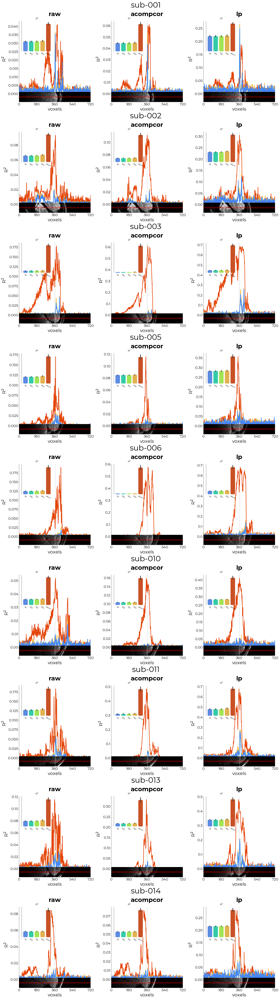

In [94]:
%matplotlib inline
cols = [
    "raw",
    "acompcor",
    "lp"
]

ncols = len(cols)
n_subjs = len(ddict)
fig = plt.figure(figsize=(5*ncols,6*n_subjs))
sfs = fig.subfigures(nrows=n_subjs, hspace=0.25)
for ix,(sub,tag) in enumerate(ddict.items()):

    sub_id = sub.split("-")[-1]
    print(f"Plotting {sub}")

    if n_subjs > 1:
        sub_sf = sfs[ix]
    else:
        sub_sf = sfs

    ssf = sub_sf.subfigures(ncols=ncols)
    for iix,col in enumerate(cols):
        
        # parse all subjects into single r2 dataframe
        df_r,_ = create_r2_df(
            ddict, 
            proc=col, 
            task="SRFa"
        )
        
        # imgs
        ax = ssf[iix]
        axs = ax.subplots(
            nrows=2,
            sharex=True,
            height_ratios=[0.8,0.2],
            gridspec_kw={
                "hspace": -0.2
            }
        )

        imgs = {}
        ref_slc = subj_obj.get_slc(sub)
        ref_beam = subj_obj.get_beam(sub)
        for img,ff in zip(["slice","beam"],[ref_slc,ref_beam]):

            if isinstance(ff, str):
                imgs[img] = nb.load(ff).get_fdata().squeeze()
            else:
                raise TypeError(f"{ff} is of type {type(ff)}. Must be a string pointing to a path")

        sub_r2 = utils.select_from_df(df_r, expression=f"subject = {sub_id}")
        r2_list = [
            utils.select_from_df(
                sub_r2, 
                expression=f"ix = {ii}"
            ).values.squeeze()
            for ii in utils.get_unique_ids(sub_r2, id="ix")
        ]

        cmap = "turbo" #utils.make_between_cm("white","red", as_list=True, N=5)[2:]
        colors = sns.color_palette(cmap, len(r2_list))[::-1]
        pl = plotting.LazyPlot(
            r2_list[::-1],
            axs=axs[0],
            y_label="R$^2$",
            # labels=list(select_sub.keys()),
            color=colors,
            alpha=[0.3,0.8,1],
            line_width=2,
            add_hline=0,
            title={
                "title": col,
                "fontweight": "bold"
            }
        )

        # plot r2 as bar in inset
        ax_inset = axs[0].inset_axes([0.05,0.6,0.4,0.4])
        fc = 0.5
        bar = plotting.LazyBar(
            sub_r2, 
            x="nordic",
            y="r2",
            fancy=True,
            axs=ax_inset,
            add_labels=True,
            cmap=cmap,
            font_size=pl.font_size*fc,
            label_size=pl.label_size*fc,
            title_size=pl.title_size*fc,
            sns_offset=4,
            ticks=[],
            sns_rot=-25
        )
        ax_inset.set_title(
            "R$^2$",
            fontsize=bar.font_size
        )

        for cm,cr,key,alpha in zip(
            ["Greys_r","r"],
            [False,True],
            list(imgs.keys()),
            [None,0.3]
            ):
            
            if cr:
                cm = utils.make_binary_cm(cm)

            im = axs[1].imshow(
                np.rot90(imgs[key])[310:410,:],
                cmap=cm,
                alpha=alpha
            )

        plotting.conform_ax_to_obj(
            ax=axs[1],
            y_ticks=[],
            x_label="voxels",
            x_ticks=np.linspace(0,imgs[key].shape[1],5, dtype=int)
        )

        for ax in axs:
            ax.axvspan(
                *subj_obj.get_ribbon(sub), 
                alpha=0.2, 
                color="#cccccc"
            )

    sub_sf.suptitle(
        sub, 
        fontsize=30, 
        y=1.055
    )

hr.viz._save_figure(
    fig, 
    fname="group_desc-nordic_r2", 
)

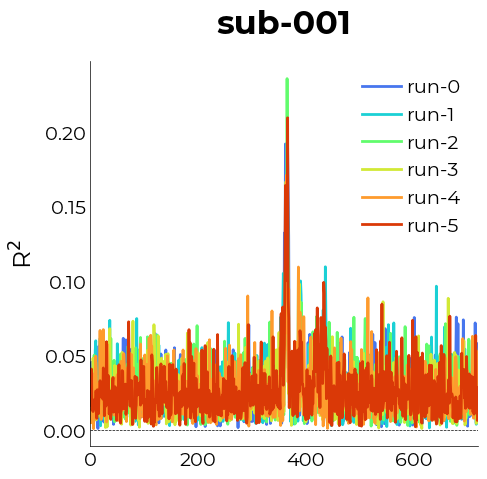

In [264]:
%matplotlib inline
cmap = "turbo" #utils.make_between_cm("white","red", as_list=True, N=5)[2:]
sub_id = utils.get_unique_ids(glm_obj.glm_output["r2"], id="subject")[0]
run_r2s = list(glm_obj.glm_output["r2"].values)
pl = plotting.LazyPlot(
    run_r2s,
    figsize=(5,5),
    y_label="R$^2$",
    labels=[f"run-{i}" for i in range(len(run_r2s))],
    cmap=cmap,
    alpha=[0.3,0.8,1],
    line_width=2,
    add_hline=0,
    title={
        "title": f"sub-{sub_id}",
        "fontweight": "bold"
    }
)

Plotting sub-001
Plotting sub-002
Plotting sub-003
Plotting sub-005
Plotting sub-006
Plotting sub-008
Plotting sub-010
Plotting sub-011
Plotting sub-013
Plotting sub-014


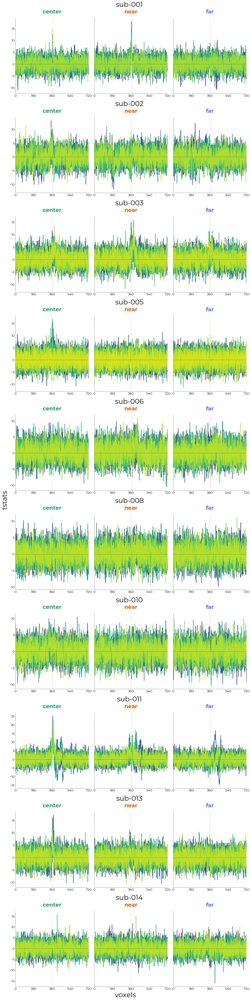

In [51]:
%matplotlib inline
evs = subj_obj.get_evs()
n_subjs = len(ddict)
fig = plt.figure(figsize=(5*len(evs),6*n_subjs), constrained_layout=True)
sfs = fig.subfigures(nrows=n_subjs)

for iix,(sub,val) in enumerate(ddict.items()):

    print(f"Plotting {sub}")
    if n_subjs>1:
        sf = sfs[iix]
    else:
        sf = sfs
        
    cmap = "viridis" #utils.make_between_cm("white","red", as_list=True, N=5)[2:]

    tstats = val["0p"]["lp"]["tstats"]
    sub_id = sub.split("-")[-1]
    axs = sf.subplots(ncols=len(evs), sharex=True, sharey=True)
    
    evs_real = utils.get_unique_ids(tstats, id="event_type")
    for ix,ev in enumerate(evs_real):
        ev_tstats = utils.select_from_df(tstats, expression=f"event_type = {ev}")
        ev_vals = list(ev_tstats.values)

        pl = plotting.LazyPlot(
            ev_vals[::-1],
            axs=axs[ix],
            # labels=[f"run-{i}" for i in range(len(ev_vals))],
            cmap=cmap,
            line_width=2,
            add_hline=0,
            title={
                "title": evs[ix],
                "color": subj_obj.get_colors()[ix],
                "fontweight": "bold"
            },
            x_ticks=np.linspace(0,720,num=5, dtype=int, endpoint=True)
        )

        axs[ix].axvspan(
            *subj_obj.get_ribbon(sub), 
            alpha=0.2, 
            color="#cccccc"
            )

    sf.suptitle(sub, fontsize=30)

fig.supylabel("tstats", fontsize=30)
fig.supxlabel("voxels", fontsize=30)
fig.show()

Text(0.5, 0.01, 'voxels')

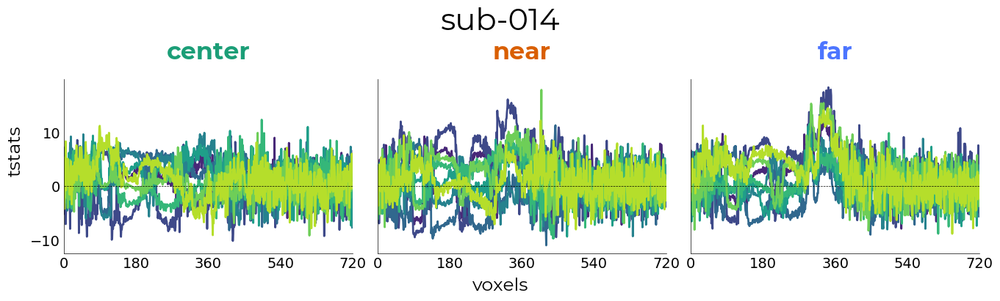

In [27]:
%matplotlib inline
cmap = "viridis" #utils.make_between_cm("white","red", as_list=True, N=5)[2:]

tstats = glm_obj.glm_output["tstats"]
sub_id = utils.get_unique_ids(tstats, id="subject")[0]

evs = utils.get_unique_ids(tstats, id="event_type")
fig,axs = plt.subplots(
    ncols=len(evs), 
    figsize=(4.5*len(evs),4), 
    sharey=True, 
    sharex=True,
    constrained_layout=True
)

for ix,ev in enumerate(evs):
    ev_tstats = utils.select_from_df(tstats, expression=f"event_type = {ev}")
    ev_vals = list(ev_tstats.values)

    pl = plotting.LazyPlot(
        ev_vals[::-1],
        axs=axs[ix],
        # labels=[f"run-{i}" for i in range(len(ev_vals))],
        cmap=cmap,
        line_width=2,
        add_hline=0,
        title={
            "title": subj_obj.get_evs()[ix],
            "color": subj_obj.get_colors()[ix],
            "fontweight": "bold"
        },
        x_ticks=np.linspace(0,720,num=5, dtype=int, endpoint=True)
    )

fig.suptitle(f"sub-{sub_id}", fontsize=30)
fig.supylabel("tstats", fontsize=pl.font_size)
fig.supxlabel("voxels", fontsize=pl.font_size)

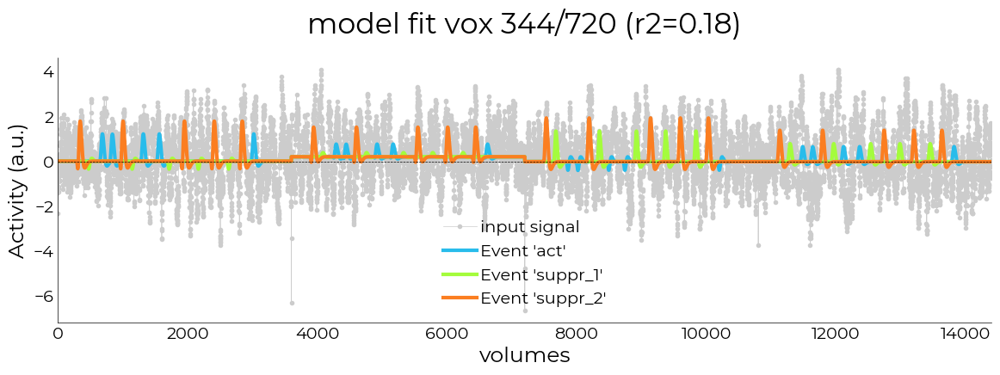

In [28]:
glm_obj.plot_ev_predictions(
    full_color="r",
    task="SRFb",
    add_hline=0,
    r2_dec=2,
    cmap="turbo"
)

In [222]:
glm_obj.glm_output["obj"]

KeyError: 'obj'

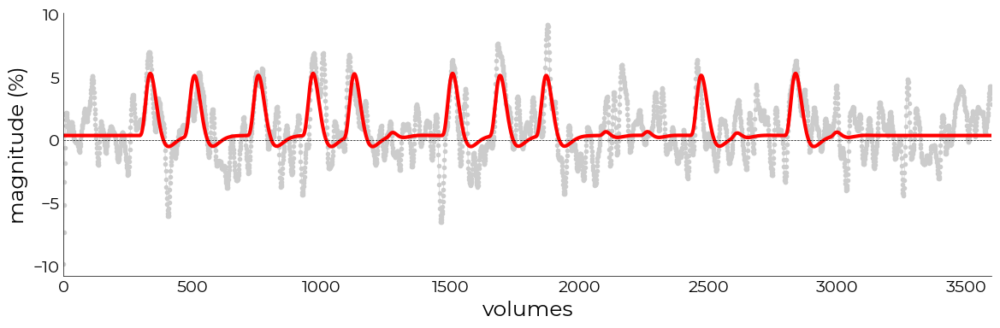

In [220]:
plotting.LazyPlot(
    [
        utils.select_from_df(df_f, expression="task = SRFa").iloc[:,max_idx].values,
        utils.select_from_df(glm_obj.glm_output["full_model"], expression="task = SRFa").iloc[:,max_idx].values
    ],
    markers=[".",None],
    line_width=[0.5,3],
    color=["#cccccc","r"],
    add_hline=0,
    x_label="volumes",
    y_label="magnitude (%)"
)

In [ ]:
plotting.LazyPlot(
    [
        utils.select_from_df(df_f, expression="task = SRFa").iloc[:,max_idx].values,
        utils.select_from_df(glm_obj.glm_output["full_model"], expression="task = SRFa").iloc[:,max_idx].values
    ],
    markers=[".",None],
    line_width=[0.5,3],
    color=["#cccccc","r"],
    add_hline=0,
    x_label="volumes",
    y_label="magnitude (%)"
)

In [203]:
glm_obj.glm_output["full_model"]

0         1         2         3         4    \
subject task run t                                                           
001     SRFa 1   0.000    1.607157 -0.282089  1.828980  0.469099 -1.188544   
                 0.105    1.607157 -0.282089  1.828980  0.469099 -1.188544   
                 0.210    1.607157 -0.282089  1.828980  0.469099 -1.188544   
                 0.315    1.607157 -0.282089  1.828980  0.469099 -1.188544   
                 0.420    1.607157 -0.282089  1.828980  0.469099 -1.188544   
...                            ...       ...       ...       ...       ...   
        SRFb 3   377.475  2.383418  1.276123  3.409832  1.721508 -0.237869   
                 377.580  2.383418  1.276123  3.409832  1.721508 -0.237869   
                 377.685  2.383418  1.276123  3.409832  1.721508 -0.237869   
                 377.790  2.383418  1.276123  3.409832  1.721508 -0.237869   
                 377.895  2.383418  1.276123  3.409832  1.721508 -0.237869   

                               5         6         7         8        9    \
subject task run t                                                          
001     SRFa 1   0.000    2.059905  0.540183  2.371086  2.119825  1.18878   
                 0.105    2.059905  0.540183  2.371086  2.119825  1.18878   
                 0.210    2.059905  0.540183  2.371086  2.119825  1.18878   
                 0.315    2.059905  0.540183  2.371086  2.119825  1.18878   
                 0.420    2.059905  0.540183  2.371086  2.119825  1.18878   
...                            ...       ...       ...       ...      ...   
        SRFb 3   377.475  1.001768  2.991814 -0.370218  1.588178  2.58643   
                 377.580  1.001768  2.991814 -0.370218  1.588178  2.58643   
                 377.685  1.001768  2.991814 -0.370218  1.588178  2.58643   
                 377.790  1.001768  2.991814 -0.370218  1.588178  2.58643   
                 377.895  1.001768  2.991814 -0.370218  1.588178  2.58643   

                          ...       710       711       712       713  \
subject task run t        ...                                           
001     SRFa 1   0.000    ...  1.173901  3.009978  4.244253  0.844042   
                 0.105    ...  1.173901  3.009978  4.244253  0.844042   
                 0.210    ...  1.173901  3.009978  4.244253  0.844042   
                 0.315    ...  1.173901  3.009978  4.244253  0.844042   
                 0.420    ...  1.173901  3.009978  4.244253  0.844042   
...                       ...       ...       ...       ...       ...   
        SRFb 3   377.475  ...  0.738142  0.424721  1.406209 -2.529392   
                 377.580  ...  0.738142  0.424721  1.406209 -2.529392   
                 377.685  ...  0.738142  0.424721  1.406209 -2.529392   
                 377.790  ...  0.738142  0.424721  1.406209 -2.529392   
                 377.895  ...  0.738142  0.424721  1.406209 -2.529392   

                               714       715       716       717       718  \
subject task run t                                                           
001     SRFa 1   0.000    2.413706  2.896652 -0.548573 -0.362155  4.568566   
                 0.105    2.413706  2.896652 -0.548573 -0.362155  4.568566   
                 0.210    2.413706  2.896652 -0.548573 -0.362155  4.568566   
                 0.315    2.413706  2.896652 -0.548573 -0.362155  4.568566   
                 0.420    2.413706  2.896652 -0.548573 -0.362155  4.568566   
...                            ...       ...       ...       ...       ...   
        SRFb 3   377.475  0.298605  0.010936  0.312166  1.311953 -0.879720   
                 377.580  0.298605  0.010936  0.312166  1.311953 -0.879720   
                 377.685  0.298605  0.010936  0.312166  1.311953 -0.879720   
                 377.790  0.298605  0.010936  0.312166  1.311953 -0.879720   
                 377.895  0.298605  0.010936  0.312166  1.311953 -0.879720   

                               719  
subject task

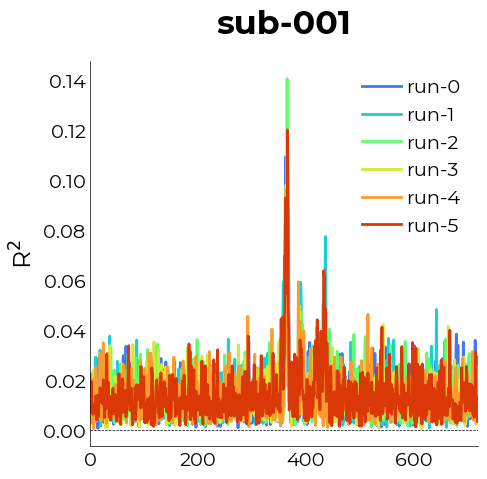

In [193]:
%matplotlib inline
cmap = "turbo" #utils.make_between_cm("white","red", as_list=True, N=5)[2:]
sub_id = utils.get_unique_ids(glm_obj.glm_output["r2"], id="subject")[0]
run_r2s = list(glm_obj.glm_output["r2"].values)
pl = plotting.LazyPlot(
    run_r2s,
    figsize=(5,5),
    y_label="R$^2$",
    labels=[f"run-{i}" for i in range(len(run_r2s))],
    cmap=cmap,
    alpha=[0.3,0.8,1],
    line_width=2,
    add_hline=0,
    title={
        "title": f"sub-{sub_id}",
        "fontweight": "bold"
    }
)

In [196]:
np.where(glm_obj.glm_output["r2"].values>0.1)[-1]

array([362, 366, 365, 366])

In [9]:
def create_r2_df(ddict, proc="lp"):

    dfs = []
    r2_list = []
    for k,v in ddict.items():
        for ix,(kk,vv) in enumerate(v.items()):
            r2 = vv[proc].results["r2"]
            r2_list.append(r2)
            df = pd.DataFrame(r2, columns=["r2"])
            df["subject"] = k.split("-")[-1]
            df["ix"],df["nordic"] = ix,kk

            dfs.append(df)

    dfs = pd.concat(dfs)
    dfs.set_index(["subject","nordic","ix"], inplace=True)
    return dfs,r2_list

Plotting sub-001


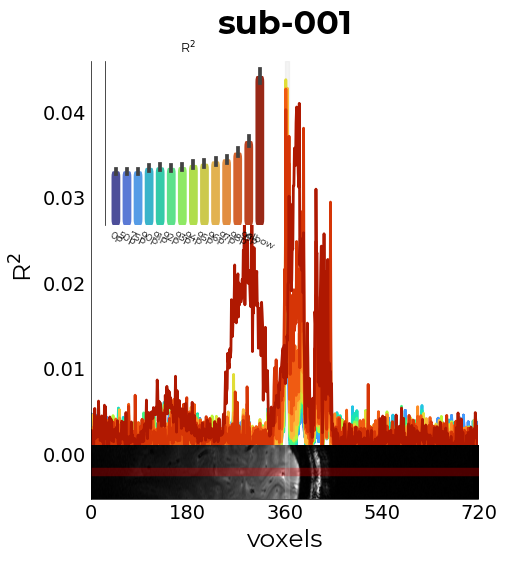

In [10]:
df_r,r2_r = create_r2_df(ddict, proc="raw")
df_r

%matplotlib inline
fig = plt.figure(figsize=(5,6))
ax = fig.subfigures()

print(f"Plotting {sub}")

imgs = {}
ref_slc = subj_obj.get_slc(sub)
ref_beam = subj_obj.get_beam(sub)
for img,ff in zip(["slice","beam"],[ref_slc,ref_beam]):

    if isinstance(ff, str):
        imgs[img] = nb.load(ff).get_fdata().squeeze()
    else:
        raise TypeError(f"{ff} is of type {type(ff)}. Must be a string pointing to a path")
# imgs

axs = ax.subplots(
    nrows=2,
    sharex=True,
    height_ratios=[0.8,0.2],
    gridspec_kw={
        "hspace": -0.2
    }
)

cmap = "turbo" #utils.make_between_cm("white","red", as_list=True, N=5)[2:]
pl = plotting.LazyPlot(
    r2_r,
    axs=axs[0],
    y_label="R$^2$",
    # labels=list(select_sub.keys()),
    cmap=cmap,
    alpha=[0.3,0.8,1],
    line_width=2,
    add_hline=0,
    title={
        "title": sub,
        "fontweight": "bold"
    }
)

# plot r2 as bar in inset
ax_inset = axs[0].inset_axes([0.05,0.6,0.4,0.4])
fc = 0.5
bar = plotting.LazyBar(
    df_r, 
    x="nordic",
    y="r2",
    fancy=True,
    axs=ax_inset,
    add_labels=True,
    cmap=cmap,
    font_size=pl.font_size*fc,
    label_size=pl.label_size*fc,
    title_size=pl.title_size*fc,
    sns_offset=4,
    ticks=[],
    sns_rot=-25
)
ax_inset.set_title(
    "R$^2$",
    fontsize=bar.font_size
)

for cm,cr,key,alpha in zip(
    ["Greys_r","r"],
    [False,True],
    list(imgs.keys()),
    [None,0.3]
    ):
    
    if cr:
        cm = utils.make_binary_cm(cm)

    im = axs[1].imshow(
        np.rot90(imgs[key])[310:410,:],
        cmap=cm,
        alpha=alpha
    )

plotting.conform_ax_to_obj(
    ax=axs[1],
    y_ticks=[],
    x_label="voxels",
    x_ticks=np.linspace(0,imgs[key].shape[1],5, dtype=int)
)

for ax in axs:
    ax.axvspan(
        *subj_obj.get_ribbon(sub), 
        alpha=0.2, 
        color="#cccccc"
    )

In [11]:
df,r2_l = create_r2_df(ddict)
df

r2
subject nordic ix          
001     0p     0   0.014330
               0   0.027679
               0   0.018193
               0   0.015387
               0   0.012557
...                     ...
        elbow  13  0.020501
               13  0.011731
               13  0.024413
               13  0.005949
               13  0.011575

[10080 rows x 1 columns]

In [12]:
ddict[sub][nordic_ID]

{'obj': <holeresponse.data.H5Parser at 0x7f0418cef430>,
 'raw': <linescanning.glm.GenericGLM at 0x7f02281ee100>,
 'ica': <linescanning.glm.GenericGLM at 0x7f0255244850>,
 'lp': <linescanning.glm.GenericGLM at 0x7f0220808d30>}

In [13]:
for key,val in ddict[sub].items():
    print(f"{key}: {val}")

0p: {'obj': <holeresponse.data.H5Parser object at 0x7f045157cd60>, 'raw': <linescanning.glm.GenericGLM object at 0x7f043e223e80>, 'ica': <linescanning.glm.GenericGLM object at 0x7f0451439310>, 'lp': <linescanning.glm.GenericGLM object at 0x7f043df909d0>}
50p: {'obj': <holeresponse.data.H5Parser object at 0x7f043e223e50>, 'raw': <linescanning.glm.GenericGLM object at 0x7f044d6f7d60>, 'ica': <linescanning.glm.GenericGLM object at 0x7f044d4cfd30>, 'lp': <linescanning.glm.GenericGLM object at 0x7f0451439a00>}
75p: {'obj': <holeresponse.data.H5Parser object at 0x7f044d7c9040>, 'raw': <linescanning.glm.GenericGLM object at 0x7f0420269b50>, 'ica': <linescanning.glm.GenericGLM object at 0x7f041b7c1df0>, 'lp': <linescanning.glm.GenericGLM object at 0x7f041bf30910>}
90p: {'obj': <holeresponse.data.H5Parser object at 0x7f041bf30700>, 'raw': <linescanning.glm.GenericGLM object at 0x7f041be76850>, 'ica': <linescanning.glm.GenericGLM object at 0x7f041bd755b0>, 'lp': <linescanning.glm.GenericGLM obje

Text(0.5, 0.98, 'sub-001')

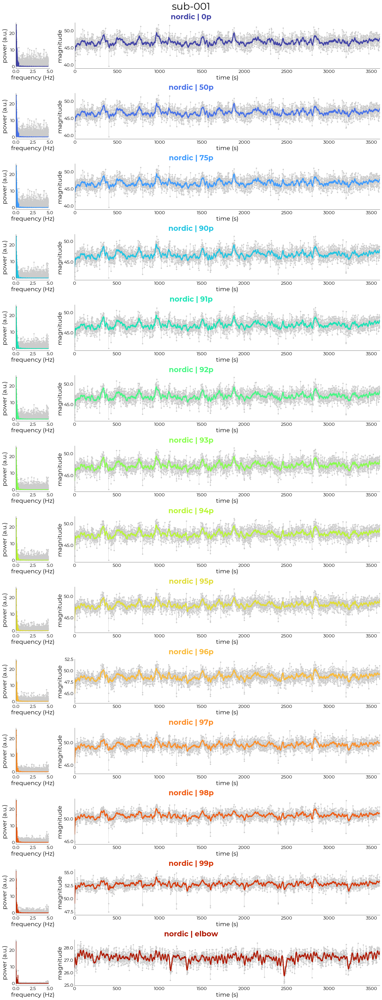

In [14]:
%matplotlib inline
import seaborn as sns
fig = plt.figure(
    figsize=(16,len(ddict[sub])*3), 
    constrained_layout=True
)

sfs = fig.subfigures(
    nrows=len(ddict[sub])
)

sesID = subj_obj.get_session(sub)
colors = sns.color_palette("turbo", len(ddict[sub]))
avg_nordic = []
for ix,(key,val) in enumerate(ddict[sub].items()):

    h5_obj = val["obj"]
    df_orig = utils.select_from_df(
        h5_obj.df_raw, 
        expression="ribbon", 
        indices=subj_obj.get_ribbon(sub)
    )

    df_filt = preproc.DataFilter(
        df_orig,
        filter_strategy="lp",
        lp_kw={
            "window_length": 31,
            "polyorder": 3,
        }
    ).get_result()
    
    avg = h5_obj.plot_task_avg(
        orig=df_orig,
        filt=df_filt,
        plot_title={
            "title": sub,
            "fontweight": "bold"
        },
        incl_task="SRFa",
        sf=sfs[ix],
        use_cols=["#cccccc",colors[ix]],
        title={
            "t": f"nordic | {key}",
            "fontweight": "bold",
            "color": colors[ix],
            "fontsize": 22
        },
        add_hline="mean",
        y_dec=1
    )

    avg_nordic.append(avg)

fig.suptitle(sub, fontsize=30)

In [88]:
# df_orig = utils.select_from_df(
#         h5_obj.df_raw, 
#         expression="ribbon", 
#         indices=subj_obj.get_ribbon(sub)
#     )

# df_filt = preproc.DataFilter(
#     df_orig,
#     filter_strategy="lp",
#     lp_kw={
#         "window_length": 51,
#         "polyorder": 3,
#         "verbose": True
#     }
# ).get_result()

# avg = h5_obj.plot_task_avg(
#     orig=df_orig,
#     filt=df_filt,
#     plot_title={
#         "title": sub,
#         "fontweight": "bold"
#     },
#     incl_task="SRFa",
#     # sf=axs[ix],
#     use_cols=["#cccccc",colors[ix]],
#     title={
#         "t": f"nordic | {key}",
#         "fontweight": "bold",
#         "color": colors[ix],
#         "fontsize": 20
#     },
#     add_hline="mean"
# )

(<Axes: title={'center': 'component-dependent correlations'}, xlabel='components removed', ylabel='components removed'>,
 <linescanning.plotting.Defaults at 0x7f02a9997c70>)

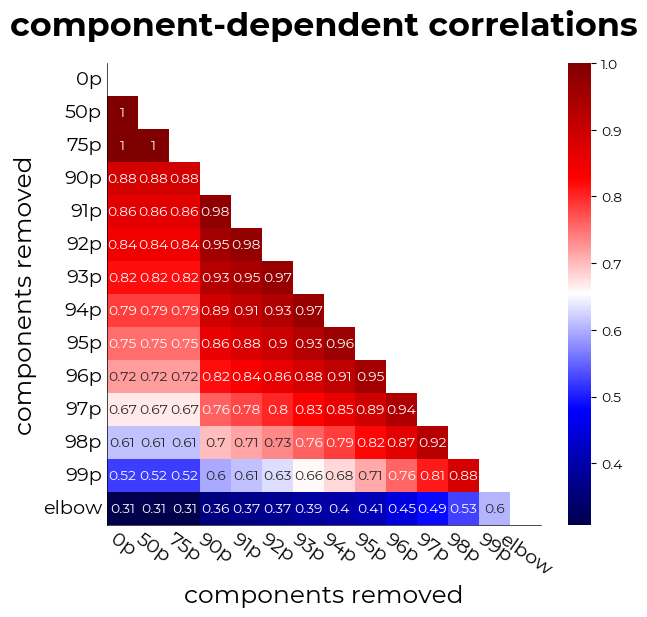

In [38]:
dfs = []

df_nordic = pd.concat([i.iloc[:,0] for i in avg_nordic], axis=1)
df_nordic.columns = columns=list(ddict[sub].keys())

corr = df_nordic.corr()
mask = np.zeros_like(corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True
corr[mask] = np.nan

fig,axs = plt.subplots(figsize=(7,6))
sns.heatmap(
    corr, 
    ax=axs,
    # xticklabels=[i.replace("_"," ") for i in incl],
    # yticklabels=[i.replace("_"," ") for i in incl],
    cmap="seismic",
    annot=True
)
axs.set_yticks(axs.get_yticks(), rotation=0, labels=axs.get_yticklabels())
axs.set_xticks(axs.get_xticks(), rotation=-35, labels=axs.get_xticklabels())
plotting.conform_ax_to_obj(
    ax=axs,
    title={
        "title": "component-dependent correlations",
        "fontweight": "bold",
    },
    x_label="components removed",
    y_label="components removed"
)

In [130]:
ddict[sub]["99p"]

{'obj': <holeresponse.data.H5Parser at 0x7fbe2a289310>,
 'raw': <linescanning.glm.GenericGLM at 0x7fbe390f3460>,
 'ica': <linescanning.glm.GenericGLM at 0x7fbe3ae43d00>,
 'lp': <linescanning.glm.GenericGLM at 0x7fbe3b8d4970>}

Text(0.5, 1.05, 'sub-001')

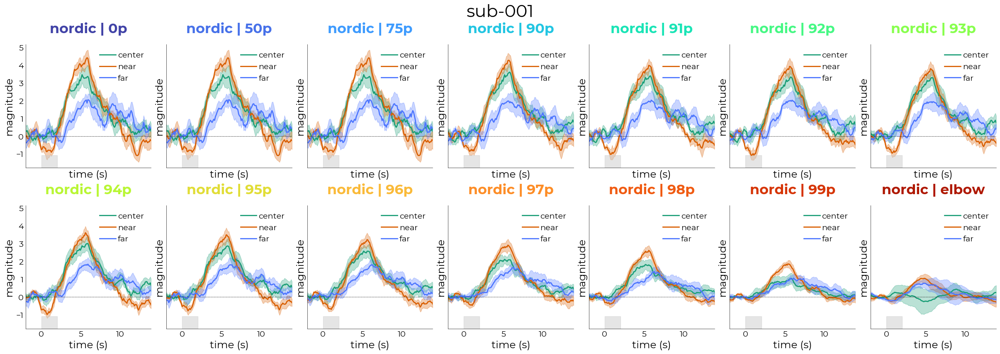

In [30]:
ncols = 7
nrows = int(np.ceil(len(ddict[sub])/ncols))
fig,axs = plt.subplots(
    ncols=ncols,
    nrows=nrows,
    figsize=(24,nrows*4), 
    constrained_layout=True,
    sharey=True,
    sharex=True
)

for ix,(key,val) in enumerate(ddict[sub].items()):

    sub_df = val["avg_epoch"]
    obj_gm = hr.viz.PlotEpochProfiles(
        sub_df.groupby(["event_type","epoch","t"]).mean()["gm"],
        axs=axs.flatten()[ix],
        ev_names=["center","near","far"],
        cm=subj_obj.get_colors(),
        y_label="magnitude",
        title={
            "title": f"nordic | {key}",
            "fontweight": "bold",
            "color": colors[ix],
            "fontsize": 22
        },
        bsl=20,
        force_title=True
    )

fig.suptitle(sub, fontsize=30, y=1.05)

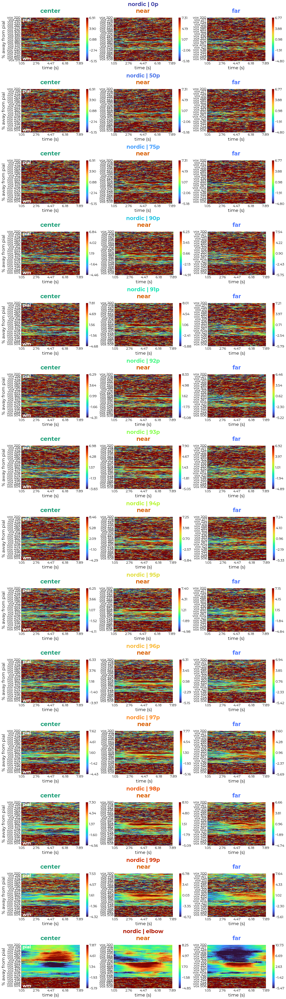

In [37]:
fig = plt.figure(
    figsize=(16,len(ddict[sub])*4), 
    constrained_layout=True
)

rrange = (200,520)
sfs = fig.subfigures(nrows=len(ddict[sub]))
for ix,(key,val) in enumerate(ddict[sub].items()):
    
    sf = sfs[ix]
    input_df = utils.select_from_df(
        val["line_epoch"].groupby(["event_type","epoch","t"]).mean(), 
        expression="ribbon", 
        indices=rrange
    )

    xy_avg = hr.viz.XinYuPlot(
        input_df,
        show_time=[1,8],
        ev_names=subj_obj.get_evs(),
        ev_colors=subj_obj.get_colors(),
        cm="turbo",
        axs=sf,
        time_ticks=5,
        # depth_ticks=720,
        cb_kws={
            "cm_decimal": 2
        },
        contours=False,
        # cont_lines=np.arange(0,1,0.05),
        cont_kws={
            "cmap": "Greys"
        },
        relative_to="center",
        sns_kws={
            "vmin": -0.5,
            "vmax": 1
        },
        title={
            "t": f"nordic | {key}",
            "fontweight": "bold",
            "color": colors[ix],
            "fontsize": 22
        },
        as_depth=False
    )

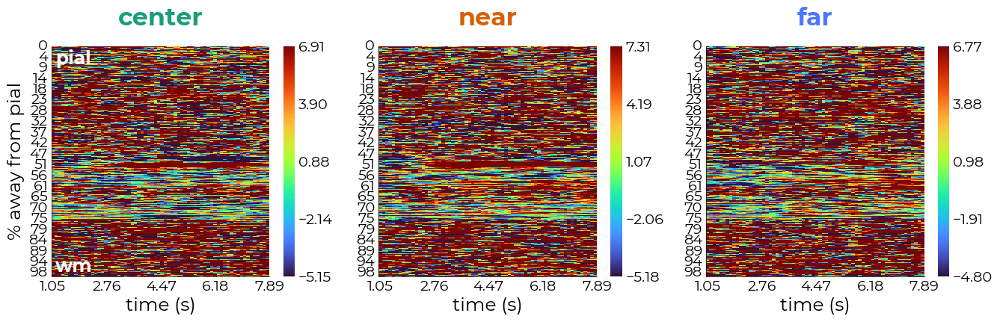

In [154]:
rrange = (200,520)
input_df = utils.select_from_df(line_df.groupby(["event_type","epoch","t"]).mean(), expression="ribbon", indices=rrange)
xy_avg = hr.viz.XinYuPlot(
    input_df,
    show_time=[1,8],
    ev_names=subj_obj.get_evs(),
    ev_colors=subj_obj.get_colors(),
    cm="turbo",
    time_ticks=5,
    # depth_ticks=720,
    cb_kws={
        "cm_decimal": 2
    },
    contours=False,
    # cont_lines=np.arange(0,1,0.05),
    cont_kws={
        "cmap": "Greys"
    },
    relative_to="center",
    sns_kws={
        "vmin": -0.5,
        "vmax": 1
    }
)

# hr.viz._save_figure(xy_avg.fig, fname="group_desc-group_epochs_depth")

In [149]:
xy_avg.avg_imshow["center"]

t,1.05,1.16,1.26,1.37,1.47,1.58,1.68,1.79,1.89,2.00,...,6.95,7.05,7.16,7.26,7.37,7.47,7.58,7.68,7.79,7.89
0,-0.294217,-1.193556,-1.147708,-1.457350,-0.237755,-0.056963,-0.072320,0.015374,1.434955,2.161283,...,-0.041184,-0.374794,-0.430435,0.001961,0.092987,0.339953,0.997641,1.199857,2.613653,2.476883
0,5.864953,4.474311,3.775120,3.564082,2.127831,1.356010,0.894000,0.821475,1.541960,1.010918,...,4.346800,4.727734,4.925942,4.997695,5.258383,5.383226,4.525339,4.037101,3.511566,3.273437
0,1.925007,1.964588,1.968792,1.123060,1.295012,1.503211,1.468603,1.002970,0.832452,1.228416,...,-1.034614,-0.828128,-1.804866,-1.308670,-1.142744,-1.160879,-1.663133,-2.218734,-2.984612,-2.776204
0,1.136270,2.174379,3.166683,3.574735,3.885300,4.964936,3.933969,3.981455,3.830973,3.392923,...,1.711044,1.449209,2.498170,2.683383,2.768430,2.972243,4.396646,3.446833,3.414298,2.696017
0,-0.312056,-0.073130,-0.057267,1.101492,1.452304,0.679520,0.600491,-0.567164,-0.232808,-0.749425,...,-0.977646,-1.085787,-1.904703,-1.837636,-1.364050,-1.305637,-1.284683,0.067531,0.656585,0.681036
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99,2.222643,1.819688,1.891373,2.454059,2.102064,2.156810,2.175375,2.976550,3.191834,3.192767,...,0.118261,0.146036,1.553046,2.282085,1.972861,1.826358,1.529286,2.403086,2.092741,1.779407
99,1.543311,1.235782,1.976099,2.017427,3.206388,2.941850,3.015887,2.505849,2.533449,3.611742,...,-0.106383,0.428914,1.535803,3.199092,3.574361,4.453189,4.123318,3.305515,3.214669,2.528267
99,1.389536,1.176475,0.942926,0.678524,1.650833,1.962520,1.267458,1.604442,1.274053,1.119424,...,1.919128,2.679657,2.630832,3.492980,4.149510,4.778931,4.660503,3.703393,3.075199,2.513711
99,4.863798,4.589592,4.503808,4.270558,3.584737,2.714886,2.098073,2.079090,1.437393,2.101492,...,0.911323,0.685397,-0.220334,0.319293,0.486402,0.048648,1.827374,2.097769,2.541390,1.764266


In [38]:
for k,v in ddict.items():
    for kk,vv in v.items():
        print(f"{kk}: {vv}")

50p: {'obj': <holeresponse.data.H5Parser object at 0x7fca300b11f0>, 'raw': <linescanning.glm.GenericGLM object at 0x7fc9fadc2580>, 'ica': <linescanning.glm.GenericGLM object at 0x7fc9eb958640>, 'lp': <linescanning.glm.GenericGLM object at 0x7fc9f3240b50>}
55p: {'obj': <holeresponse.data.H5Parser object at 0x7fca7fd630d0>, 'raw': <linescanning.glm.GenericGLM object at 0x7fc9d0b71250>, 'ica': <linescanning.glm.GenericGLM object at 0x7fc9d84ea340>, 'lp': <linescanning.glm.GenericGLM object at 0x7fc9d8766ca0>}
60p: {'obj': <holeresponse.data.H5Parser object at 0x7fc9fadc2a30>, 'raw': <linescanning.glm.GenericGLM object at 0x7fcadafcd550>, 'ica': <linescanning.glm.GenericGLM object at 0x7fca02694880>, 'lp': <linescanning.glm.GenericGLM object at 0x7fcb14300eb0>}
65p: {'obj': <holeresponse.data.H5Parser object at 0x7fca0dd68c70>, 'raw': <linescanning.glm.GenericGLM object at 0x7fcafd476670>, 'ica': <linescanning.glm.GenericGLM object at 0x7fcb0c7727c0>, 'lp': <linescanning.glm.GenericGLM obj

In [36]:
ddict["sub-001"]["elbow"]["lp"].results["r2"].shape

(720,)